In [1]:
%matplotlib inline
%config InlineBackend.figure_formats=['svg']
import matplotlib.cm as cm
from matplotlib import rcParams
rcParams['figure.figsize'] = 8, 6
import csv
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.path as path
import matplotlib.dates as mdates
from dateutil.parser import parse
from datetime import datetime
from datetime import timedelta
import urllib2
import pytz
from matplotlib.backends.backend_pdf import PdfPages
from scipy.optimize import curve_fit
from scipy import asarray as ar,exp

In [2]:
#binary search algorithm for finding closest date in a list to the given date
#returns list element index for element within delta of given date
def findNearestDate(alist, date, delta):
    first = 0
    last = len(alist)-1
    found = False
    index = -1

    while first<=last and not found:
        midpoint = (first + last)//2
        #print 'comparing difference of ', alist[midpoint]-date, ' to ', delta
        if abs(alist[midpoint]-date) < delta :
            index = midpoint
            found = True
        else:
            if date < alist[midpoint]:
                last = midpoint-1
            else:
                first = midpoint+1
    if index==0:
        print 'WARNING: index is unexpectedly first entry in array!'
    return index

In [3]:
# function to re-average data within specific date ranges (date = array of dates to use as bounds for averaging)
def add(x,y): return x+y
def mergeData(raw_date,CPM,date):
    merged_data = []
    # since integration window may vary we need to keep track of error separately
    merged_error = []
    # keep track of date corresponding to each re-averaged CPM entry
    merged_date = []

    #CPM and date are indexed exactly the same
    # -> we should be able to use date index finder for sampling CPM data
    # otherwise try something smarter like a map with date as key
    delta = timedelta(minutes=5)
    min_index = findNearestDate(raw_date, date[0], delta)+1

    # first entry in reduced array is summed CPM from hour prior to first entry in air monitor data
    cpm_sum = CPM[(min_index-12):min_index]
    merged_error.append(np.sqrt(reduce(add, 5*cpm_sum))/(5*len(cpm_sum)))
    merged_data.append(reduce(add, cpm_sum)/len(cpm_sum))
    merged_date.append(date[0])

    #now loop over all dates in air monitor data and merge DoseNet CPM for the previous hour
    # increment index by one to included data taken at same time as monitor data
    for i in range(0,len(date)-1) :
        min_index = findNearestDate(raw_date, date[i], delta)+1
        #make sure a valid index is returned and if not move on to next date
        while min_index==0:
            i+=1
            min_index = findNearestDate(raw_date, date[i], delta)+1

        max_index = findNearestDate(raw_date, date[i+1], delta)+1
        #make sure a valid index is returned and if not move on to next date
        while max_index==0:
            i+=1
            max_index = findNearestDate(raw_date, date[i+1], delta)+1

        cpm_sum = CPM[min_index:max_index]

        #add all points in this slice and append to new DoseNet data array
        # counting statistic -> error/min = sqrt(N_counts)/N_min (5min per entry)
        merged_error.append(np.sqrt(reduce(add, 5*cpm_sum))/(5*len(cpm_sum)))
        merged_data.append(reduce(add, cpm_sum)/len(cpm_sum))
        merged_date.append(date[i+1])
        i+=1
    return [merged_date, merged_data, merged_error]

In [4]:
def make_array(lst): 
    '''
    Makes list into an array. Also splices out the irrelevant stuff 
    for a spectra
    '''
    y = np.asarray(make_int(lst[12:]))
    return y



In [5]:
def calculateCorrelationCoefficient(data_x, data_y):
    # stats are [average, variance]
    x_stats = [0,0]
    y_stats = [0,0]
    ndata = len(data_x)
    for i in range(0,ndata):
        x_stats[0] += data_x[i]
        y_stats[0] += data_y[i]

    x_stats[0] = x_stats[0]/ndata
    y_stats[0] = y_stats[0]/ndata

    sum_xy = 0
    for i in range(0,ndata):
        sum_xy += (data_x[i]-x_stats[0])*(data_y[i]-y_stats[0])
        x_stats[1] += (data_x[i]-x_stats[0])*(data_x[i]-x_stats[0])
        y_stats[1] += (data_y[i]-y_stats[0])*(data_y[i]-y_stats[0])

    #correlation coefficient generally referred to as r
    # r = sum( (x-ave_x)*(y-ave_y) ) / sqrt( sum( (x-ave_x)^2 )*sum( (y-ave_y)^2 ) )
    r = sum_xy/np.sqrt(x_stats[1]*y_stats[1])

    #calculate variance of x(y) from sum of delta-x(y) squared
    x_stats[1] = np.sqrt(x_stats[1]/(ndata-1))
    y_stats[1] = np.sqrt(y_stats[1]/(ndata-1))
    
    return r, x_stats, y_stats

In [6]:
def calculateSigma(func, data):
    sum_sqrs = 0
    for i in range(0,len(func)):
        diff = abs(func[i]-data[i])
        sum_sqrs += diff*diff
        
    rms = np.sqrt(sum_sqrs)/(len(func)-2)
    return rms

In [16]:
# import data from weather station for all isotopes
date = []
cpm = []
cpm_error = []
line = 0
url = 'https://radwatch.berkeley.edu/sites/default/files/dosenet/lbl_outside_d3s.csv'
response = urllib2.urlopen(url)

reader = csv.reader(response, delimiter=",")

for row in reader:
    # skip meta-data
    if line == 0:
        print ", ".join(row)
    else:
        #print ", ".join(row)
        date.append(parse(row[1]))
        cpm.append(float(row[3]))
        cpm_error.append(float(row[4]))
    line += 1

print 'collected data between ', date[0], ' and ', date[-1]

<addinfourl at 4693177840 whose fp = <socket._fileobject object at 0x117bc9050>>
deviceTime_utc, deviceTime_local, deviceTime_unix, cpm, cpmError, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192

In [19]:
# graph all weather data together
fig, ax = plt.subplots()

ax.plot(date, cpm, 'bo-', label="CPM")
ax.errorbar(date, cpm, yerr=cpm_error, fmt='bo', ecolor='b')

handles, labels = ax.get_legend_handles_labels()
ax.legend(handles, labels, loc=2)
#ax.set_yscale("log", nonposy='clip')

# format the ticks
ax.xaxis.set_major_locator(mdates.DayLocator(bymonthday=range(1,32), interval=3))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))

# set x-axis scale and display format
ax.set_xlim(date[0], date[-1])
ax.fmt_xdata = mdates.DateFormatter('%Y-%m-%d')
# rotates and right aligns the x labels
# moves the bottom of the axes up to make room for them
fig.autofmt_xdate()

plt.ylabel('counts-per-minute')
plt.ylim(1000,4000)
plt.xlabel('Time')
plt.title('CPM vs time')

plt.show()

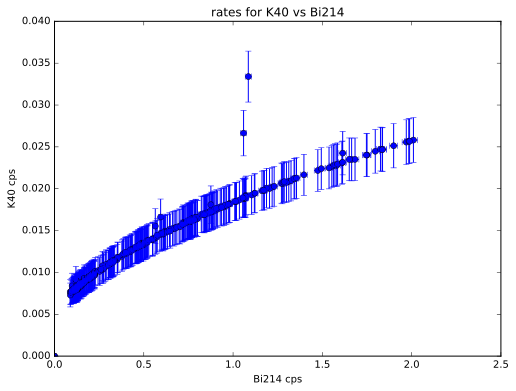

In [8]:
rows = [r for r in reader]
def gaus(x,a,x0,sigma):
    return a*exp(-(x-x0)**2/(2*sigma**2))

def peak_finder(array,lower,upper): 
    '''
    Peak Finder for Potassium. Needs more development
    '''
    points = ar(range(lower,upper))
    peak = list(array[lower:upper])
    counts = ar(potassium)
    popt,pcov = curve_fit(gaus,points,counts,p0=[1,mean,sigma])
    return popt

def get_peaks(number, n=1, lower_limit=270, upper_limit=292): 
    '''
    Main Function. 
    Number is the number of spectras to go through (Right now the total number is being used)
    n is the number of hours that each spectra is integrated over. Default is 1. 
    It was experimentally determined that the channel for the K-40 centroid lies between 270 and 292 for the current
    peak finder. If a centroid falls outside that range (the lower_limit and upper_limit), then it is put in the anomaly list
    and it is plotted. 
    In order to plot individual spectra, tune the lower_limit and upper_limit (these only plot spectra outside the range)
    '''

    entries = 12*n
    anomaly = []
    days = (24/n)
    i = 0
    counter = 0
    means = []
    day = 1
    while i < number:
        if counter < days:
            integration = rows[(i*entries)+1:((i+1)*entries)+1]
            array_lst = [] 
            for j in first_integration:
                array_lst.append(make_array(j))

            integrated = sum(array_lst)
            fit_parameters = peak_finder(integrated,260,301)
            means.append(fit_parameters[1])
            fig = plt.figure()
            fig.patch.set_facecolor('white')
            plt.title('Spectra integrated over a day')
            plt.xlabel('channels')
            plt.ylabel('counts')
            plt.xlim(1,500)
            #plt.ylim()
            x = ar(0,len(integrated))
            plt.plot(x,integrated,'b:',label='data')
            plt.plot(x,gaus(x,*popt),'ro:',label='fit')
            plt.legend()
            plt.semilogy(integrated)
            plt.show()
            i+=1
            counter +=1 
        else:
            print('plotted', day)
            counter = 0
            indexes = []
            day += 1 
    #plt.title('1460 Centroid versus Time for Day {}'.format(day))
    #plt.xlabel('Hour of the Day')
    #plt.ylabel('1460 Centroid')
    #plt.plot(indexes, 'ro')
    #plt.ylim(260, 300)
    #plt.show()
    print('plotted', day)
    counter = 0
    indexes = []
    day += 1
    if anomaly:
        print(anomaly)
    else: 
        print('There are no anomalies')
        